#Import dependecies

In [ ]:
!pip install nltk==3.4

In [ ]:
!pip install cufflinks --upgrade

Requirement already up-to-date: cufflinks in /usr/local/lib/python3.7/dist-packages (0.17.3)


In [ ]:
from google.colab import drive
from bs4 import BeautifulSoup
import pandas as pd
import nltk                                # Python library for NLP
import re
import matplotlib.pyplot as plt
import time

In [ ]:
#iplot imports and config
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
import plotly.io as pio
pio.renderers.default = 'colab'

#Config Kaggle and Google Drive

In [ ]:
#mount drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#create directory if dosen't exist
!mkdir -p /content/drive/MyDrive/Kaggle/stackoverflow/

In [ ]:
#config kaggle
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/MyDrive/Kaggle"

In [ ]:
#change current dir
%cd /content/drive/MyDrive/Kaggle/stackoverflow/

/content/drive/MyDrive/Kaggle/stackoverflow


#Load Data "First Time"

##Download dataset and unzip it

In [ ]:
#download dataset
!kaggle datasets download -d stackoverflow/pythonquestions

 98% 545M/558M [00:09<00:00, 43.8MB/s]
100% 558M/558M [00:09<00:00, 59.1MB/s]


In [ ]:
#extract dataset and remove .zip files
!unzip \*.zip  && rm *.zip

Archive:  pythonquestions.zip
  inflating: Answers.csv             
  inflating: Questions.csv           
  inflating: Tags.csv                


##Load data


In [ ]:
%%time
ques = pd.read_csv("Questions.csv",engine='python')
ans = pd.read_csv("Answers.csv",engine='python')
tags = pd.read_csv("Tags.csv",engine='python')


CPU times: user 44.7 s, sys: 3.37 s, total: 48.1 s
Wall time: 49.4 s


##PreProcessing

###Extract code and text from HTML

In [ ]:
def split_html(html_string):
  """
    input:
      html_string (HTML string representing question body or answer body)
    return:
      tuple(text,code)
      text:text without the code(String)
      code:list of codeblocks(list)
  """
  bs = BeautifulSoup(html_string,"html.parser")
  code_list = [code_block.extract().get_text() for code_block in bs.find_all("code")]
  return bs.get_text(),code_list

####Great example
There is a great example showing our first problem when splitting
take a look at this answer https://stackoverflow.com/a/595  
The following code show the same answer in our dataset
before spliting the code and text and after.  

The problem is that an answer in stack-overflow most like be splited into more than one paragraph.  
most likely the structure of one answer will something like this:-  
-explantion block  
-code block  
-explantion block  
-code block  
-explantion block  
-code block  

if we concatenate the text togther without code, i think(personal opinion) we will lose the meaning.  
if we merged diff codeblock into one codeblock,we may have syntax error.  
I will leave this for now and move on to the rest of the notebook.

In [ ]:
print("before splitting:-\n",ans.loc[5,"Body"])


before splitting:-
 <p>The canonical way is to use the built-in cursor iterator.</p>

<pre><code>curs.execute('select * from people')
for row in curs:
    print row
</code></pre>

<hr>

<p>You can use <code>fetchall()</code> to get all rows at once.</p>

<pre><code>for row in curs.fetchall():
    print row
</code></pre>

<p>It can be convenient to use this to create a Python list containing the values returned:</p>

<pre><code>curs.execute('select first_name from people')
names = [row[0] for row in curs.fetchall()]
</code></pre>

<p>This can be useful for smaller result sets, but can have bad side effects if the result set is large.</p>

<ul>
<li><p>You have to wait for the entire result set to be returned to
your client process.</p></li>
<li><p>You may eat up a lot of memory in your client to hold
the built-up list.</p></li>
<li><p>It may take a while for Python to construct and deconstruct the
list which you are going to immediately discard anyways.</p></li>
</ul>

<hr>

<p>If you kn

In [ ]:
print("Text part after splitting:-\n\n\n",split_html(ans.loc[5,"Body"])[0])

Text part after splitting:-


 The canonical way is to use the built-in cursor iterator.


You can use  to get all rows at once.

It can be convenient to use this to create a Python list containing the values returned:

This can be useful for smaller result sets, but can have bad side effects if the result set is large.

You have to wait for the entire result set to be returned to
your client process.
You may eat up a lot of memory in your client to hold
the built-up list.
It may take a while for Python to construct and deconstruct the
list which you are going to immediately discard anyways.


If you know there's a single row being returned in the result set you can call  to get the single row.


Finally, you can loop over the result set fetching one row at a time.  In general, there's no particular advantage in doing this over using the iterator.




In [ ]:
print("code part after splitting:-\n",*split_html(ans.loc[5,"Body"])[1],sep="\n-----------new codeblock-----------\n\n")


code part after splitting:-

-----------new codeblock-----------

curs.execute('select * from people')
for row in curs:
    print row

-----------new codeblock-----------

fetchall()
-----------new codeblock-----------

for row in curs.fetchall():
    print row

-----------new codeblock-----------

curs.execute('select first_name from people')
names = [row[0] for row in curs.fetchall()]

-----------new codeblock-----------

fetchone()
-----------new codeblock-----------

curs.execute('select max(x) from t')
maxValue = curs.fetchone()[0]

-----------new codeblock-----------

row = curs.fetchone()
while row:
    print row
    row = curs.fetchone()



####Split HTML

In [ ]:
%%time
splitted = ques['Body'].apply(split_html)

CPU times: user 5min 13s, sys: 2.09 s, total: 5min 15s
Wall time: 5min 15s


In [ ]:
%%time
text = [x[0] for x in splitted]
code = [x[1] for x in splitted]
ques["Text"]=pd.Series(text)
ques["Code"]=pd.Series(code)

CPU times: user 1.18 s, sys: 42 ms, total: 1.22 s
Wall time: 1.22 s


In [ ]:
%%time
splitted = ans['Body'].apply(split_html)
text = [x[0] for x in splitted]
code = [x[1] for x in splitted]
ans["Text"]=pd.Series(text)
ans["Code"]=pd.Series(code)

CPU times: user 7min 14s, sys: 4.77 s, total: 7min 19s
Wall time: 7min 19s


In [ ]:
#reduce memory usage
del splitted
del text
del code

###Remove newlines

In [ ]:
def remove_newlines(text):
  return re.sub('(\r\n)+|\r+|\n+', " ",  text)

###Normalize

In [ ]:
def normalize(text):
  return text.lower()

###Tokenize

In [ ]:
def tokenize(text):
  #just word splitting for now for under_standing the data
  return text.split()

###Remove stopwords


In [ ]:
from nltk.corpus import stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
stop_words = set(stopwords.words('english'))

In [ ]:
def remove_stopwords(tokens):
  return [w for w in tokens if not w in stop_words] 

###Clean Text and Code

In [ ]:
def clean_text(text):
    return remove_stopwords(tokenize(normalize(remove_newlines(text))))

In [ ]:
def clean_code(code):
  return tokenize(code)

###Process Dataset

In [ ]:
%%time
ques["TitleClean"] = ques["Title"].apply(clean_text)
ques["TextClean"] = ques["Text"].apply(clean_text)
ques["CodeClean"] = ques["Code"].apply(lambda lst:[ clean_code(code) for code in lst])
ans["TextClean"] = ans["Text"].apply(clean_text)
ans["CodeClean"] = ans["Code"].apply(lambda lst:[ clean_code(code) for code in lst])


CPU times: user 2min 3s, sys: 9.76 s, total: 2min 12s
Wall time: 2min 12s


In [ ]:
ques.head(20)

,Id,OwnerUserId,CreationDate,Score,Title,Body,Text,Code,TitleClean,TextClean,CodeClean
0,469,147.0,2008-08-02T15:11:16Z,21,How can I find the full path to a font from it...,<p>I am using the Photoshop's javascript API t...,I am using the Photoshop's javascript API to f...,[],"[find, full, path, font, display, name, mac?]","[using, photoshop's, javascript, api, find, fo...",[]
1,502,147.0,2008-08-02T17:01:58Z,27,Get a preview JPEG of a PDF on Windows?,<p>I have a cross-platform (Python) applicatio...,I have a cross-platform (Python) application w...,[],"[get, preview, jpeg, pdf, windows?]","[cross-platform, (python), application, needs,...",[]
2,535,154.0,2008-08-02T18:43:54Z,40,Continuous Integration System for a Python Cod...,<p>I'm starting work on a hobby project with a...,I'm starting work on a hobby project with a py...,[],"[continuous, integration, system, python, code...","[i'm, starting, work, hobby, project, python, ...",[]
3,594,116.0,2008-08-03T01:15:08Z,25,cx_Oracle: How do I iterate over a result set?,<p>There are several ways to iterate over a re...,There are several ways to iterate over a resul...,[],"[cx_oracle:, iterate, result, set?]","[several, ways, iterate, result, set., tradeof...",[]
4,683,199.0,2008-08-03T13:19:16Z,28,Using 'in' to match an attribute of Python obj...,<p>I don't remember whether I was dreaming or ...,I don't remember whether I was dreaming or not...,"[foo in iter_attr(array of python objects, att...","[using, 'in', match, attribute, python, object...","[remember, whether, dreaming, seem, recall, fu...","[[foo, in, iter_attr(array, of, python, object..."
5,742,189.0,2008-08-03T15:55:28Z,30,Class views in Django,"<p><a href=""http://www.djangoproject.com/"">Dja...","Django view points to a function, which can be...",[],"[class, views, django]","[django, view, points, function,, problem, wan...",[]
6,766,1384652.0,2008-08-03T17:44:07Z,20,Python and MySQL,<p>I can get Python to work with Postgresql bu...,I can get Python to work with Postgresql but I...,[],"[python, mysql]","[get, python, work, postgresql, cannot, get, w...",[]
7,773,207.0,2008-08-03T18:27:09Z,256,How do I use Python's itertools.groupby()?,<p>I haven't been able to find an understandab...,I haven't been able to find an understandable ...,"[itertools.groupby(), lxml, itertools.groupby()]","[use, python's, itertools.groupby()?]","[able, find, understandable, explanation, actu...","[[itertools.groupby()], [lxml], [itertools.gro..."
8,972,145.0,2008-08-04T02:17:51Z,364,Adding a Method to an Existing Object Instance,<p>I've read that it is possible to add a meth...,I've read that it is possible to add a method ...,"[self, self, class.patch(obj), class.patch()]","[adding, method, existing, object, instance]","[i've, read, possible, add, method, existing, ...","[[self], [self], [class.patch(obj)], [class.pa..."
9,1476,92.0,2008-08-04T18:20:36Z,251,How do you express binary literals in Python?,<p>How do you express an integer as a binary n...,How do you express an integer as a binary numb...,[ >>> 0x12AF\n 4783\n >>> 0x100\n ...,"[express, binary, literals, python?]","[express, integer, binary, number, python, lit...","[[>>>, 0x12AF, 4783, >>>, 0x100, 256], [>>>, 0..."


##Save preprocessed dataset

In [ ]:
#save preprocessed questions data
ques.to_pickle("./Ques.pkl")

In [ ]:
#save new answer
ans.to_pickle("./Ans.pkl")

In [ ]:
#save tags
tags.to_pickle("./Tags.pkl")

#Load PreProcessed Data

In [ ]:
#load PreProcessed data
ques = pd.read_pickle("./Ques.pkl")
ans = pd.read_pickle("./Ans.pkl")
tags = pd.read_pickle("./Tags.pkl")

# Statistics


In [ ]:
pd.set_option('display.max_colwidth', 10)

##General methods

###N-Grams

In [ ]:
def n_gram(n,pandas_series,top_k=20):
  """
  input:
    n => n-grams
    tok_k => top k occurence of n-gram
    panda_series => panda_column to get n-gram (each row is a list)
  return:
      ngram => top k most occured n-gram(pandas_series)
  """
  grams =[]
  for i,rw in pandas_series.items():
    grams.extend(nltk.ngrams(rw, n))
    #if i%100000==0:
     # print("{0:.2g}% completed".format(i/pandas_series.shape[0]*100))
  return (pd.Series(grams).value_counts())[:top_k]
  

In [ ]:
def plot_ngram_hist(most_occurence_ngram_series):
  """
  input:
    most_occurence_ngram_series =>most occured ngram(pandas_series)
  return(void)
    plot n-gram histogram
  """
  #len of n-gram
  n = len(most_occurence_ngram_series.first_valid_index())
  most_occurence_ngram_series.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))
  plt.title('{} Most Frequently Occuring {}-grams'.format(most_occurence_ngram_series.shape[0],n))
  plt.ylabel('{}-gram'.format(n))
  plt.xlabel('# of Occurances')  

##Questions statistics

###Questions Title statistics

CPU times: user 4.86 s, sys: 663 ms, total: 5.52 s
Wall time: 5.53 s


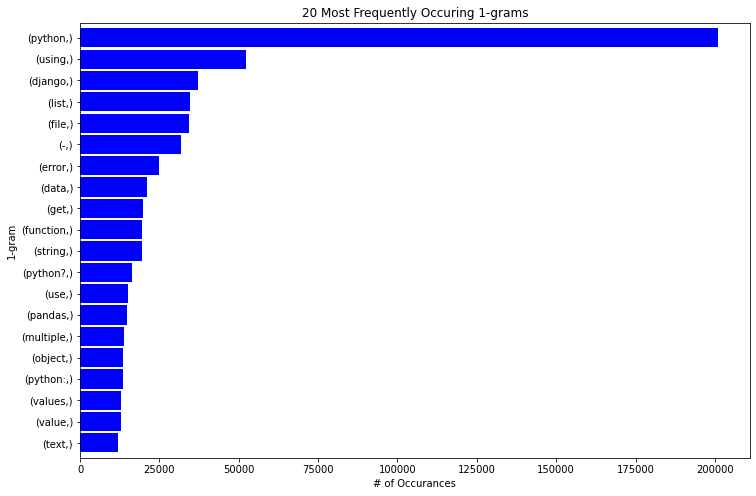

In [ ]:
#1-grams
%%time
top_grams = n_gram(1,ques["TitleClean"])
plot_ngram_hist(top_grams)

CPU times: user 7.68 s, sys: 442 ms, total: 8.12 s
Wall time: 8.08 s


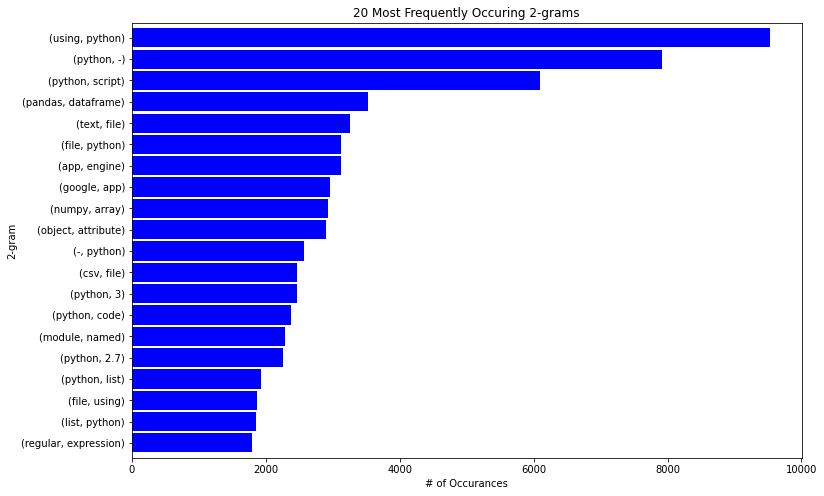

In [ ]:
#2-grams
%%time
top_grams = n_gram(2,ques["TitleClean"])
plot_ngram_hist(top_grams)

CPU times: user 9.33 s, sys: 128 ms, total: 9.46 s
Wall time: 9.4 s


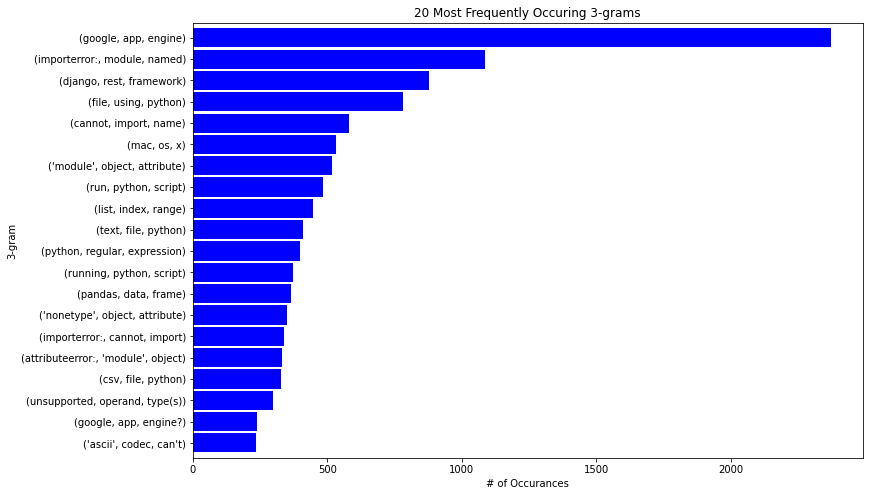

In [ ]:
#3-grams
%%time
top_grams = n_gram(3,ques["TitleClean"])
plot_ngram_hist(top_grams)

CPU times: user 8.61 s, sys: 127 ms, total: 8.74 s
Wall time: 8.68 s


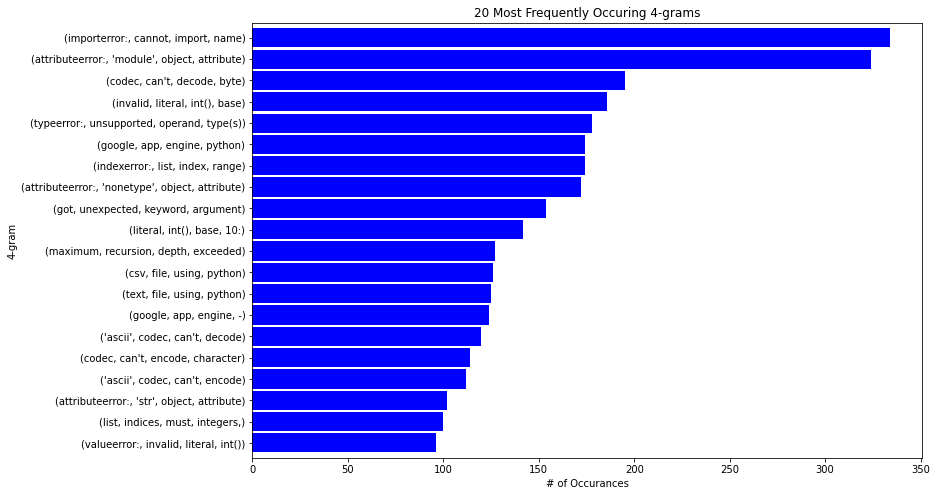

In [ ]:
#4-grams
%%time
top_grams = n_gram(4,ques["TitleClean"])
plot_ngram_hist(top_grams)

In [ ]:
print("number of Questions :" ,ques.shape[0])

number of Questions : 607282


In [ ]:
ques["TitleLen"]= ques["CodeClean"].apply(len)

In [ ]:
ques["TitleLen"].iplot(
    kind='hist',
    bins=50,
    xTitle='Number of words in Title',
    linecolor='black',
    yTitle='count',
    title='Number of words in Title')

In [ ]:
print("Mean of word in Title ",ques["TitleLen"].mean())

Mean of word in Title  5.765273793723509


In [ ]:
print("Min of word in Title ",ques["TitleLen"].min())

Min of word in Title  1


In [ ]:
print("Max of word in Title ",ques["TitleLen"].max())

Max of word in Title  23


###Questions BodyText statistics

CPU times: user 36.5 s, sys: 4.06 s, total: 40.6 s
Wall time: 40.4 s


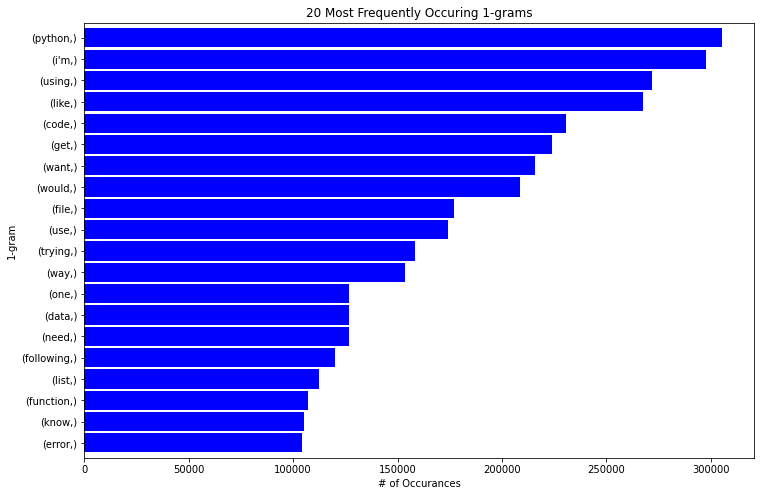

In [ ]:
#1-grams
%%time
top_grams = n_gram(1,ques["TextClean"])
plot_ngram_hist(top_grams)

CPU times: user 1min 20s, sys: 3.09 s, total: 1min 23s
Wall time: 1min 22s


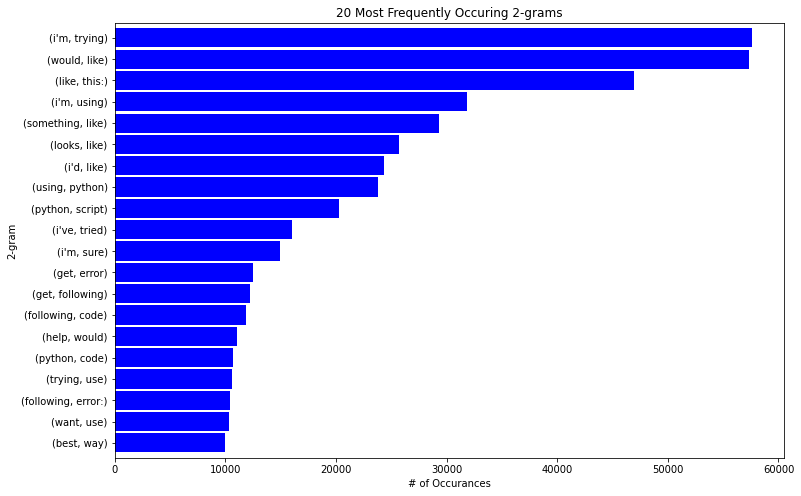

In [ ]:
#2-grams
%%time
top_grams = n_gram(2,ques["TextClean"])
plot_ngram_hist(top_grams)

CPU times: user 1min 56s, sys: 868 ms, total: 1min 57s
Wall time: 1min 56s


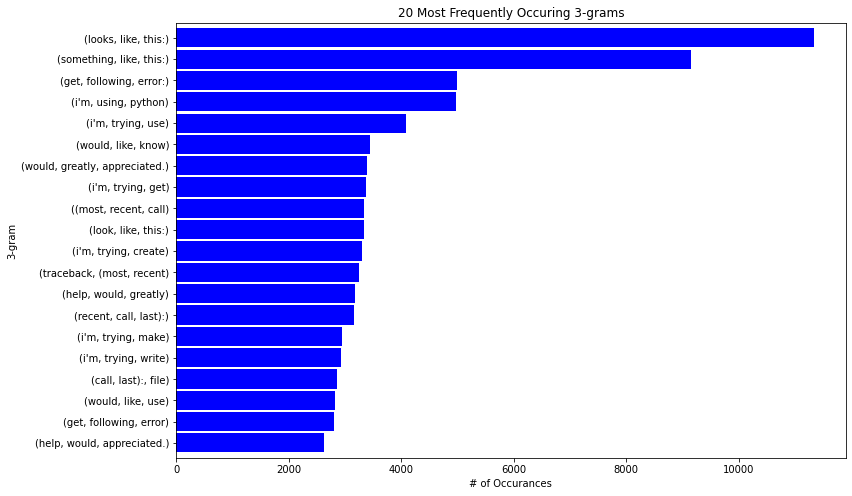

In [ ]:
#3-grams
%%time
top_grams = n_gram(3,ques["TextClean"])
plot_ngram_hist(top_grams)

In [ ]:
ques["TextLen"]= ques["TextClean"].apply(len)

In [ ]:
ques[ques['TextLen']<500]['TextLen'].iplot(
    kind='hist',
    bins=50,
    xTitle='Number of English words in Question Body',
    linecolor='black',
    yTitle='count',
    title='Number of words in Body < 500')

In [ ]:
ques[ques['TextLen']>500]['TextLen'].iplot(
    kind='hist',
    bins=100,
    xTitle='Number of English words in Question Body',
    linecolor='black',
    yTitle='count',
    title='Number of words in Body >500')

In [ ]:
print("Mean of word in Title ",ques["TextLen"].mean())

Mean of word in Title  48.57415665209903


In [ ]:
print("Min of word in Title ",ques["TextLen"].min())

Min of word in Title  0


In [ ]:
print("Min of word in Title ",ques["TextLen"].max())

Min of word in Title  3427


###Questions Score statistics

In [ ]:
per = ques[ques['Score']<0].shape[0]/ques['Score'].shape[0] *100
print("persantage of questions with negative score: {0:.2g}%".format(per))

persantage of questions with negative score: 6%


In [ ]:
per = ques[(ques['Score']>=0)&(ques['Score']<=5)].shape[0]/ques['Score'].shape[0] *100
print("persantage of questions with score from 0-5: {0:.2g}%".format(per))

persantage of questions with score from 0-5: 87%


In [ ]:
per = ques[ques['Score']==0].shape[0]/ques['Score'].shape[0] *100
print("persantage of questions with score equal 0: {0:.2g}%".format(per))

persantage of questions with score equal 0: 40%


###Code Block length

In [ ]:
pd.set_option('display.max_colwidth', 20)


In [ ]:
ques.loc[4,'CodeClean']

[['foo',
  'in',
  'iter_attr(array',
  'of',
  'python',
  'objects,',
  'attribute',
  'name)']]

In [ ]:
ques.loc[4,'Code']

['foo in iter_attr(array of python objects, attribute name)']

In [ ]:
ques['No_Code_Blocks']=ques['Code'].apply(len)

In [ ]:
ques.head()

,Id,OwnerUserId,CreationDate,Score,Title,Body,Text,Code,TitleClean,TextClean,CodeClean,TitleLen,TextLen,No_Code_Blocks
0,469,147.0,2008-08-02T15:11...,21,How can I find t...,<p>I am using th...,I am using the P...,[],"[find, full, pat...","[using, photosho...",[],0,41,0
1,502,147.0,2008-08-02T17:01...,27,Get a preview JP...,<p>I have a cros...,I have a cross-p...,[],"[get, preview, j...","[cross-platform,...",[],0,17,0
2,535,154.0,2008-08-02T18:43...,40,Continuous Integ...,<p>I'm starting ...,I'm starting wor...,[],"[continuous, int...","[i'm, starting, ...",[],0,55,0
3,594,116.0,2008-08-03T01:15...,25,cx_Oracle: How d...,<p>There are sev...,There are severa...,[],"[cx_oracle:, ite...","[several, ways, ...",[],0,7,0
4,683,199.0,2008-08-03T13:19...,28,Using 'in' to ma...,<p>I don't remem...,I don't remember...,[foo in iter_att...,"[using, 'in', ma...","[remember, wheth...","[[foo, in, iter_...",1,18,1


In [ ]:
ques['No_Code_Blocks'].iplot(
    kind='hist',
    bins=100,
    xTitle='Number of code block in each Question',
    linecolor='black',
    yTitle='count',
    title='Number of code blocks in each Question ')

In [ ]:
code_length=[]
for rw in ques['CodeClean']:
  for cd_block in rw:
    code_length.append(len(cd_block))
  
x=pd.Series(code_length)

In [ ]:
x[x<150].iplot(
    kind='hist',
    bins=150,
    xTitle='length of each code block in Question',
    linecolor='black',
    yTitle='count',
    title='Code Block length in Queastions ')

In [ ]:
print("Number of code blocks with length 1:  {0} \nThe percentage = {1:.2f}% ".format(len(x[x==1]),(len(x[x==1])/len(x)*100)))

Number of code blocks with length 1:  603247 
The percentage = 35.21% 


In [ ]:
print("Number of code blocks with length less than 10:  {0} \nThe percentage = {1:.2f}% ".format(len(x[x<10]),(len(x[x<10])/len(x)*100)))

Number of code blocks with length less than 10:  1007677 
The percentage = 58.82% 


In [ ]:
print("Number of code blocks with length 0:  {0} \nThe percentage = {1:.2f}% ".format(len(x[x==0]),(len(x[x==0])/len(x)*100)))

Number of code blocks with length 0:  239 
The percentage = 0.01% 


In [ ]:
print("Number of code blocks with length less than 100:  {0} \nThe percentage = {1:.2f}% ".format(len(x[x<100]),(len(x[x<100])/len(x)*100)))

Number of code blocks with length less than 100:  1635986 
The percentage = 95.49% 


In [ ]:
print("Number of code blocks with length less than 150:  {0} \nThe percentage = {1:.2f}% ".format(len(x[x<150]),(len(x[x<150])/len(x)*100)))

Number of code blocks with length less than 150:  1673749 
The percentage = 97.70% 


In [ ]:
print("Number of code blocks with length less than 250:  {0} \nThe percentage = {1:.2f}% ".format(len(x[x<250]),(len(x[x<250])/len(x)*100)))

Number of code blocks with length less than 250:  1697576 
The percentage = 99.09% 
